In [15]:
import pandas as pd
import matplotlib.pyplot as plt
import pickle
import numpy as np
from sklearn.preprocessing import StandardScaler, MinMaxScaler, QuantileTransformer
from sklearn.ensemble import HistGradientBoostingRegressor as hgbr
from sklearn.multioutput import MultiOutputRegressor
from sklearn.metrics import r2_score as r2 
import shap

In [16]:
# Open the pickle file
df = pickle.load(open('../../data/processed/merged_data_daily.pkl', 'rb'))
df

,AAL_Article Count_pca_001,AAL_Article Count_pca_002,AAL_Article Count_pca_003,AAL_Article Count_pca_004,AAL_Article Count_pca_005,AAL_Article Count_pca_006,AAL_Article Count_pca_007,AAL_Article Count_pca_008,AAL_Change_High-Low,AAL_Change_High-Low_lag01,...,month_of_year_11,month_of_year_12,month_of_year_2,month_of_year_3,month_of_year_4,month_of_year_5,month_of_year_6,month_of_year_7,month_of_year_8,month_of_year_9
2018-01-29,-0.029282,0.204058,1.042853,0.956171,0.167415,1.007578,-0.760258,-1.198400,-0.9850,-0.7800,...,0,0,0,0,0,0,0,0,0,0
2018-01-30,1.180619,-0.954018,-0.524185,1.953363,0.333720,0.538114,-1.353116,-0.965325,0.1150,-0.9850,...,0,0,0,0,0,0,0,0,0,0
2018-01-31,1.620852,-1.534232,-0.252524,-0.606851,0.497048,-0.504977,-0.966182,-0.488809,1.0200,0.1150,...,0,0,0,0,0,0,0,0,0,0
2018-02-01,0.802650,-0.178167,0.073775,-0.734852,1.267990,0.973000,-0.276072,-0.818937,-0.6600,1.0200,...,0,0,1,0,0,0,0,0,0,0
2018-02-02,2.045029,-0.539908,0.647642,-1.092897,0.681404,0.887556,0.158380,-0.573149,0.9100,-0.6600,...,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-05-23,-0.615558,-0.538005,0.099094,-0.120524,-0.311440,-0.212115,0.192615,-0.254671,-0.1167,0.0067,...,0,0,0,0,0,1,0,0,0,0
2025-05-27,-1.441752,-0.250022,0.307115,-0.007583,0.069717,0.249420,-0.043999,0.661228,0.1700,-0.1167,...,0,0,0,0,0,1,0,0,0,0
2025-05-28,-0.598546,-0.691015,-0.068149,0.107001,-0.007488,0.285244,-0.003486,0.456588,-0.0800,0.1700,...,0,0,0,0,0,1,0,0,0,0
2025-05-29,-1.472670,-0.075905,-0.277017,0.023585,0.298538,0.339162,0.119573,0.641219,0.0100,-0.0800,...,0,0,0,0,0,1,0,0,0,0


In [17]:
[i for i in df.columns if 'Tone' in i or 'Article' in i]

['AAL_Article Count_pca_001',
 'AAL_Article Count_pca_002',
 'AAL_Article Count_pca_003',
 'AAL_Article Count_pca_004',
 'AAL_Article Count_pca_005',
 'AAL_Article Count_pca_006',
 'AAL_Article Count_pca_007',
 'AAL_Article Count_pca_008',
 'AAL_Tone_pca_001',
 'AAL_Tone_pca_002',
 'AAL_Tone_pca_003',
 'AAL_Tone_pca_004',
 'AAL_Tone_pca_005',
 'AAL_Tone_pca_006',
 'AAL_Tone_pca_007',
 'AAL_Tone_pca_008',
 'ALGT_Article Count_pca_001',
 'ALGT_Article Count_pca_002',
 'ALGT_Article Count_pca_003',
 'ALGT_Article Count_pca_004',
 'ALGT_Article Count_pca_005',
 'ALGT_Article Count_pca_006',
 'ALGT_Article Count_pca_007',
 'ALGT_Tone_pca_001',
 'ALGT_Tone_pca_002',
 'ALGT_Tone_pca_003',
 'ALGT_Tone_pca_004',
 'ALGT_Tone_pca_005',
 'ALGT_Tone_pca_006',
 'ALGT_Tone_pca_007',
 'ALK_Article Count_pca_001',
 'ALK_Article Count_pca_002',
 'ALK_Article Count_pca_003',
 'ALK_Article Count_pca_004',
 'ALK_Article Count_pca_005',
 'ALK_Article Count_pca_006',
 'ALK_Article Count_pca_007',
 'ALK_Tone_

In [46]:
# Data preprocessing
tickers     = ['AAL','ALGT','ALK','DAL','JBLU','LUV','UAL']
tickers_all = ['AAL','ALGT','ALK','DAL','JBLU','LUV','UAL','BNO','IYT','ITA','JETS']

y_cols = [f'{i}_Volume' for i in tickers]

x_cols = [i for i in df.columns if 'lag' in i] + ['month_of_year_1','month_of_year_10','month_of_year_11','month_of_year_12','month_of_year_2','month_of_year_3','month_of_year_4','month_of_year_5','month_of_year_6','month_of_year_7','month_of_year_8','month_of_year_9','day_of_week_0','day_of_week_1','day_of_week_2','day_of_week_3','day_of_week_4']


y = df[y_cols]
x = df[x_cols]

In [47]:
# Train/test splitting
split_val  = round(0.6 * len(x))
split_test = round(0.8 * len(x))

x_train = x[:split_val]
x_val   = x[split_val:split_test]
x_test  = x[split_test:]

y_train = y[:split_val]
y_val   = y[split_val:split_test]
y_test  = y[split_test:]

In [48]:
# Normalize the features to [0,1]
sc2 = MinMaxScaler(feature_range=(0, 1))

x_train = sc2.fit_transform(x_train)
x_val   = sc2.transform(x_val)
x_test  = sc2.transform(x_test)

In [49]:
x_train.shape

(1107, 1953)

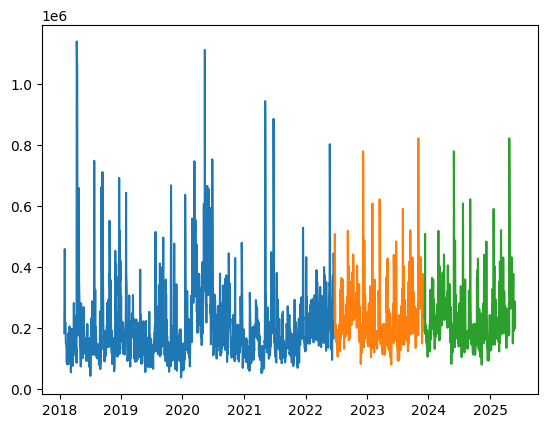

In [50]:
plt.plot(y.index[:split_val], y.iloc[:split_val,1], label='Train')
plt.plot(y.index[split_val:split_test], y.iloc[split_val:split_test,1], label='Train')
plt.plot(y.index[split_test:], y.iloc[split_val:split_test,1], label='Train')

In [72]:
x_train.mean(axis=0)[:20]

array([0.44029392, 0.42633772, 0.47177138, 0.46948002, 0.51145468,
       0.40783982, 0.48949384, 0.44635793, 0.47454944, 0.46125685,
       0.44247353, 0.44221484, 0.44197361, 0.44195616, 0.44199824,
       0.44211219, 0.44220868, 0.44229696, 0.4423021 , 0.4424725 ])

In [73]:
x_val.mean(axis=0)[:20]

array([0.44018628, 0.42605542, 0.47095954, 0.46804213, 0.50833343,
       0.40813056, 0.48905496, 0.44526122, 0.47347698, 0.46012069,
       0.44675722, 0.44688964, 0.44660324, 0.44661248, 0.44631684,
       0.44582718, 0.44557466, 0.44536833, 0.44524206, 0.44536217])

In [63]:
model = hgbr(
    learning_rate=0.01,
    min_samples_leaf=25,
    l2_regularization=1,
    max_features=0.1,
    max_leaf_nodes=None,
    max_depth=None,
    early_stopping=True,
    scoring='r2',
    n_iter_no_change=20,
    verbose=2,
    max_iter = 500,
    random_state=42
)

multimodel = {
    'model': [],
    'r2_val': [],
    'r2_test': []
}

for i in range(len(y_cols)):
    fit = model.fit(x_train, y_train.iloc[:, i], X_val=x_val, y_val=y_val.iloc[:, i])
    
    r2_val  = fit.score(x_val, y_val.iloc[:, i])
    r2_test = fit.score(x_test, y_test.iloc[:, i])

    multimodel['model'].append(fit)
    multimodel['r2_val'].append(r2_val)
    multimodel['r2_test'].append(r2_test)


Binning 0.017 GB of training data: 1.467 s
Binning 0.006 GB of validation data: 0.018 s
Fitting gradient boosted rounds:
[1/500] 1 tree, 21 leaves, max depth = 7, train score: 0.01396, val score: -0.06066, in 0.044s
[2/500] 1 tree, 20 leaves, max depth = 7, train score: 0.02752, val score: -0.05998, in 0.043s
[3/500] 1 tree, 20 leaves, max depth = 7, train score: 0.04080, val score: -0.05967, in 0.043s
[4/500] 1 tree, 21 leaves, max depth = 7, train score: 0.05383, val score: -0.06337, in 0.046s
[5/500] 1 tree, 19 leaves, max depth = 7, train score: 0.06610, val score: -0.06479, in 0.035s
[6/500] 1 tree, 22 leaves, max depth = 7, train score: 0.07851, val score: -0.06623, in 0.038s
[7/500] 1 tree, 21 leaves, max depth = 7, train score: 0.09092, val score: -0.06278, in 0.048s
[8/500] 1 tree, 19 leaves, max depth = 7, train score: 0.10293, val score: -0.05969, in 0.040s
[9/500] 1 tree, 22 leaves, max depth = 8, train score: 0.11480, val score: -0.05499, in 0.047s
[10/500] 1 tree, 20 leav

KeyboardInterrupt: 

In [43]:
results

{'model': [HistGradientBoostingRegressor(early_stopping=True, l2_regularization=0,
                                learning_rate=0.05, max_iter=500,
                                max_leaf_nodes=None, min_samples_leaf=25,
                                n_iter_no_change=20, random_state=42,
                                scoring='r2', verbose=2),
  HistGradientBoostingRegressor(early_stopping=True, l2_regularization=0,
                                learning_rate=0.05, max_iter=500,
                                max_leaf_nodes=None, min_samples_leaf=25,
                                n_iter_no_change=20, random_state=42,
                                scoring='r2', verbose=2),
  HistGradientBoostingRegressor(early_stopping=True, l2_regularization=0,
                                learning_rate=0.05, max_iter=500,
                                max_leaf_nodes=None, min_samples_leaf=25,
                                n_iter_no_change=20, random_state=42,
                       

In [12]:
multi_model.score(x_test, y_test)

0.03640576335746293

In [13]:
for model in enumerate(multi_model.estimators_):
    print(f'Model {model[0]} score: {model[1].score(x_val, y_val.iloc[:, model[0]])} on validation set, {model[1].score(x_test, y_test.iloc[:, model[0]])} on test set.')

Model 0 score: 0.15063332532076557 on validation set, 0.36675890461630034 on test set.
Model 1 score: -0.1273596685806515 on validation set, -1.0129214607454875 on test set.
Model 2 score: 0.36465981059540864 on validation set, 0.07249637337548764 on test set.
Model 3 score: 0.21759951101935615 on validation set, 0.3182561791829408 on test set.
Model 4 score: 0.29841577240898054 on validation set, -0.17646959897840286 on test set.
Model 5 score: 0.12317709056353454 on validation set, 0.3658588304748952 on test set.
Model 6 score: 0.3335581409301537 on validation set, 0.3208611155765069 on test set.


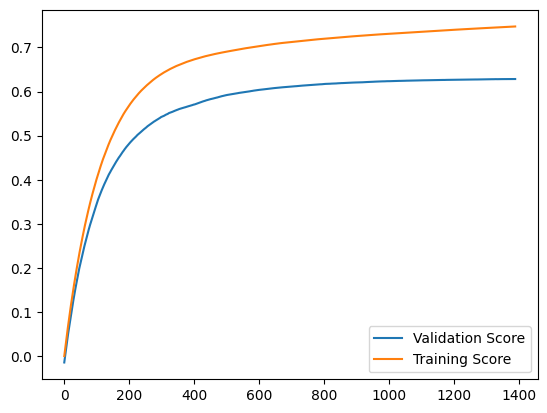

In [10]:
plt.plot(model.validation_score_, label='Validation Score')
plt.plot(model.train_score_, label='Training Score')
plt.legend()

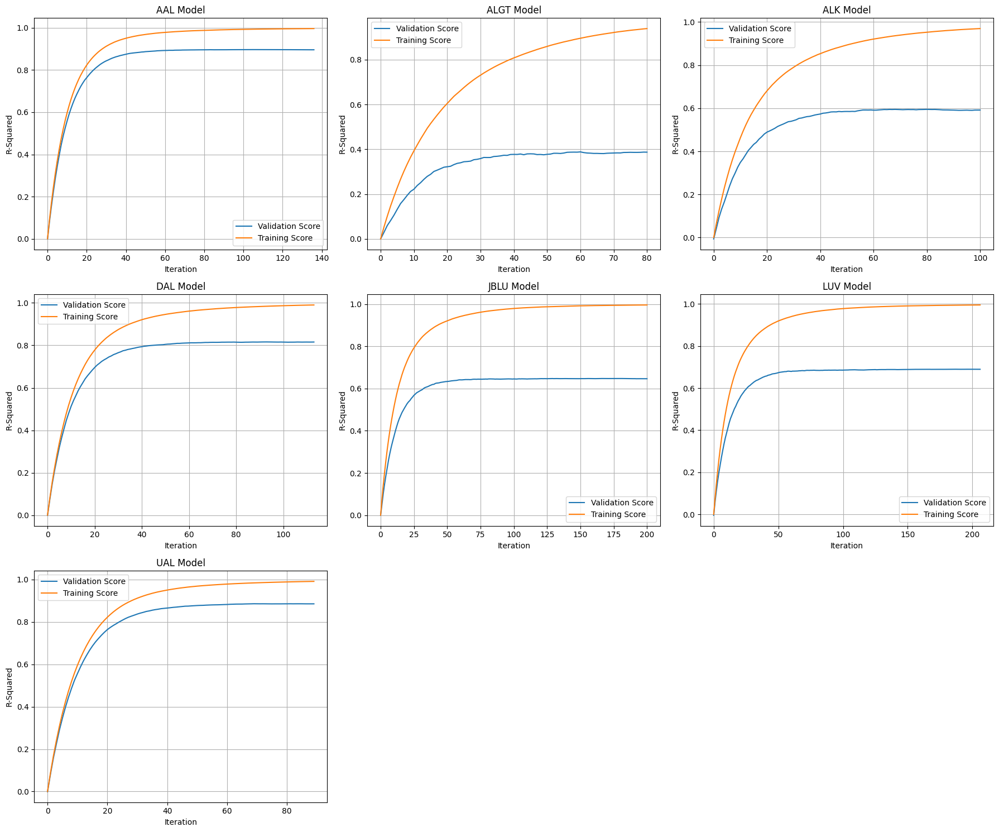

In [15]:
# Graph the training and validation loss for all estimators
fig, axs = plt.subplots(nrows=3, ncols=3, figsize=(18, 15))
axs = axs.flatten()

# Loop through all estimators
for i, estimator in enumerate(multi_model.estimators_):
    if i < len(axs):  # Ensure we don't exceed the number of subplots
        ax = axs[i]
        ax.plot(estimator.validation_score_, label='Validation Score')
        ax.plot(estimator.train_score_, label='Training Score')
        ax.set_title(f'{tickers[i]} Model')
        ax.grid(True)
        ax.set_xlabel('Iteration')
        ax.set_ylabel('R-Squared')
        ax.legend()

# Hide any unused subplots
for j in range(i+1, len(axs)):
    axs[j].set_visible(False)

plt.tight_layout()
plt.show()

In [128]:
df

,AAL_Article Count_pca_001,AAL_Article Count_pca_002,AAL_Article Count_pca_003,AAL_Article Count_pca_004,AAL_Article Count_pca_005,AAL_Article Count_pca_006,AAL_Article Count_pca_007,AAL_Change_High-Low,AAL_Change_High-Low_lag01,AAL_Change_High-Low_ma04,...,month_of_year_11,month_of_year_12,month_of_year_2,month_of_year_3,month_of_year_4,month_of_year_5,month_of_year_6,month_of_year_7,month_of_year_8,month_of_year_9
2018-01-03 09:45:00,-1.030261,0.276275,-0.319170,0.002325,0.730554,-0.731915,0.534846,-0.1000,0.2600,0.060000,...,0,0,0,0,0,0,0,0,0,0
2018-01-03 10:00:00,-0.333511,1.891296,0.388847,0.156446,-0.073690,0.886610,1.439394,-0.1000,-0.1000,0.037500,...,0,0,0,0,0,0,0,0,0,0
2018-01-03 10:15:00,-0.888399,-0.808333,-0.778003,-0.645095,0.253139,-0.590556,-1.617511,-0.1300,-0.1000,-0.017500,...,0,0,0,0,0,0,0,0,0,0
2018-01-03 10:30:00,-0.873781,-0.028215,-0.678440,0.378813,-0.468862,-0.078955,-0.033708,0.1300,-0.1300,-0.050000,...,0,0,0,0,0,0,0,0,0,0
2018-01-03 10:45:00,-0.055194,0.608274,-0.866039,1.154681,1.306107,0.735797,-0.558191,-0.0700,0.1300,-0.042500,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-05-30 14:45:00,-0.469363,-0.189147,-1.347000,-1.082792,-0.312133,0.669173,0.667384,0.0103,-0.0390,0.000500,...,0,0,0,0,0,1,0,0,0,0
2025-05-30 15:00:00,-0.742516,-0.443919,-0.024305,0.231416,0.498134,-0.779294,-0.341971,-0.0100,0.0103,-0.006225,...,0,0,0,0,0,1,0,0,0,0
2025-05-30 15:15:00,-0.952108,0.380691,0.280952,-0.686945,-0.266687,-0.355548,1.278213,0.0100,-0.0100,-0.007175,...,0,0,0,0,0,1,0,0,0,0
2025-05-30 15:30:00,-0.700404,-0.036676,-0.361924,0.022531,-0.663414,0.625317,-0.739595,-0.0100,0.0100,0.000075,...,0,0,0,0,0,1,0,0,0,0


In [59]:
np.array([i.predict(x_val) for i in multimodel['model']]).T.shape

(369, 7)

In [61]:
# Turn the model predictions into volume predictions and calculate r2
results  = df[[f'{i}_Volume' for i in tickers]][split_val:split_test]

y_pred = np.array([i.predict(x_val) for i in multimodel['model']]).T

for i in tickers:
    results[f'{i}_Volume_pred'] = y_pred[:, tickers.index(i)]

# Sort columns alphabetically
results = results.reindex(sorted(results.columns), axis=1)

results

,AAL_Volume,AAL_Volume_pred,ALGT_Volume,ALGT_Volume_pred,ALK_Volume,ALK_Volume_pred,DAL_Volume,DAL_Volume_pred,JBLU_Volume,JBLU_Volume_pred,LUV_Volume,LUV_Volume_pred,UAL_Volume,UAL_Volume_pred
2022-06-22,34193500,1.736999e+07,234003,1.736999e+07,1304400,1.736999e+07,16069100,1.736999e+07,7378000,1.736999e+07,6706300,1.736999e+07,9037000,1.736999e+07
2022-06-23,31067700,1.631905e+07,297700,1.631905e+07,1824400,1.631905e+07,15793200,1.631905e+07,11631100,1.631905e+07,6503300,1.631905e+07,11778600,1.631905e+07
2022-06-24,41326500,1.639070e+07,508600,1.639070e+07,1696500,1.639070e+07,16949500,1.639070e+07,13821600,1.639070e+07,6657600,1.639070e+07,13245200,1.639070e+07
2022-06-27,26086200,1.622351e+07,196300,1.622351e+07,1514000,1.622351e+07,12782900,1.622351e+07,16405300,1.622351e+07,4198200,1.622351e+07,9770000,1.622351e+07
2022-06-28,36545300,1.524499e+07,180200,1.524499e+07,1244000,1.524499e+07,14375200,1.524499e+07,9027200,1.524499e+07,5950800,1.524499e+07,12433800,1.524499e+07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-01,48885200,1.778776e+07,190300,1.778776e+07,2610700,1.778776e+07,11014200,1.778776e+07,13943600,1.778776e+07,7864100,1.778776e+07,10633700,1.778776e+07
2023-12-04,50756300,1.720778e+07,287200,1.720778e+07,22669400,1.720778e+07,9760000,1.720778e+07,19547700,1.720778e+07,12285200,1.720778e+07,7435100,1.720778e+07
2023-12-05,40142300,1.750909e+07,216500,1.750909e+07,9842400,1.750909e+07,7828000,1.750909e+07,17425200,1.750909e+07,8641000,1.750909e+07,7790000,1.750909e+07
2023-12-06,51354200,1.656779e+07,199400,1.656779e+07,6042700,1.656779e+07,12499600,1.656779e+07,14250100,1.656779e+07,11001100,1.656779e+07,9696100,1.656779e+07


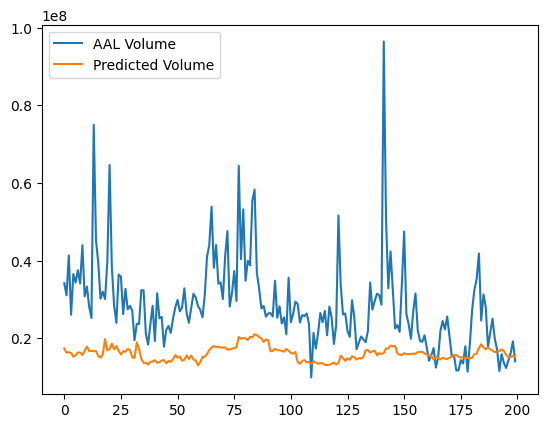

In [62]:
filter = results.iloc[:200,:]
filter.reset_index(drop=True, inplace=True)

plt.plot(filter.index, filter['AAL_Volume'], label='AAL Volume')
plt.plot(filter.index, filter['AAL_Volume_pred'], label='Predicted Volume')
plt.legend()

In [44]:
# shap values
x_sample = x_val

explainer = shap.TreeExplainer(results['model'][0], x_sample, feature_names=x.columns)
shap_values = explainer(x_sample, check_additivity=False)

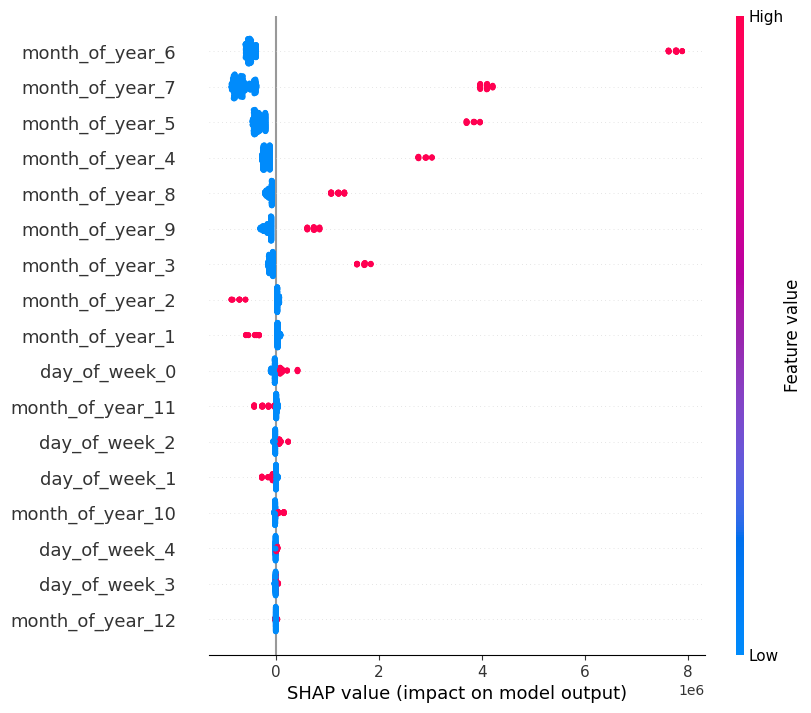

In [45]:
shap.plots.beeswarm(shap_values, max_display=20)

In [158]:
y_pred = multi_model.estimators_[0].predict(x_val)
plot_data = y_val.iloc[:, 0].to_frame()
plot_data['Time'] = plot_data.index
plot_data.reset_index(drop=True, inplace=True)

In [159]:
plot_data = pd.merge(plot_data, pd.DataFrame(y_pred, columns=['y_pred']), left_index=True, right_index=True)

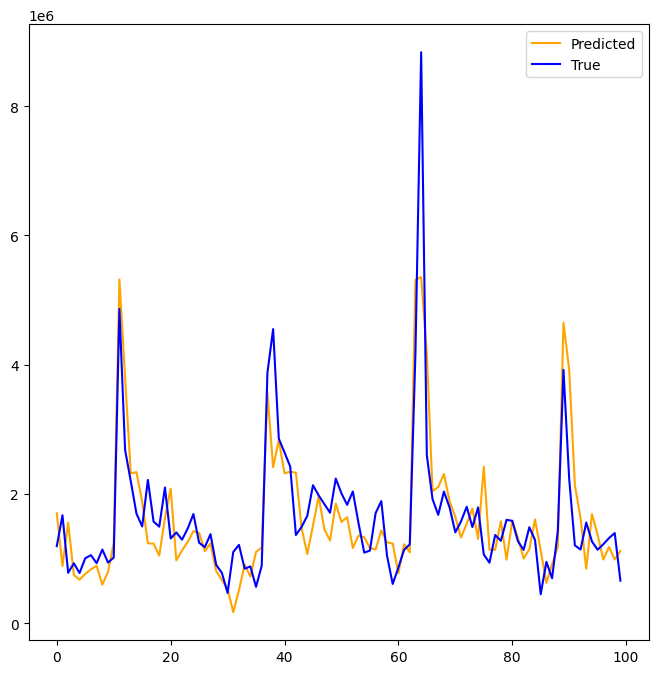

In [163]:
filter_data = plot_data.iloc[:100,:]

plt.figure(figsize=(8, 8))
plt.plot(filter_data.index, filter_data['y_pred'], label='Predicted', color='orange')
plt.plot(filter_data.index, filter_data['AAL_Volume'], label='True', color='blue')
plt.legend()

C:\Users\Steven\AppData\Local\Temp\ipykernel_1220\2646763451.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filter_data['residuals'] = filter_data['AAL_Volume'] - filter_data['y_pred']


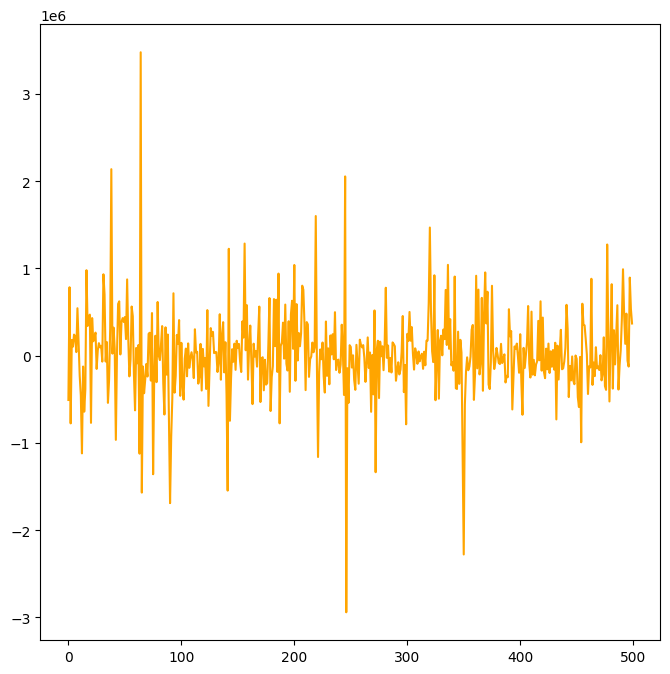

In [165]:
filter_data = plot_data.iloc[:500,:]
filter_data['residuals'] = filter_data['AAL_Volume'] - filter_data['y_pred']

plt.figure(figsize=(8, 8))
plt.plot(filter_data.index, filter_data['residuals'], label='residuals', color='orange')